In [2]:
# Setup
import pandas as pd
import pathlib
import glob
import os
import seaborn as sns
import matplotlib.pyplot as plt
from src.p00_calculate_vwc_from_revised_bulkdensity import *

inputDir = pathlib.Path.cwd() / "data" / "input"
workingDir = pathlib.Path.cwd() / "data" / "working"
outputDir = pathlib.Path.cwd() / "data" / "output"




In [3]:
# Get output file to review
filePath = sorted(outputDir.glob("VolumetricWaterContentFromRevisedBd_*.csv"))[-1]
print("File path = {}".format(filePath))

File path = c:\Dev\Projects\LtarModelingDssatForCroplands\CalculateVolumetricWCFromRevisedBulkDensity\data\output\VolumetricWaterContentFromRevisedBd_20201119.csv


In [4]:
# Load data
revisedVwc = pd.read_csv(filePath)
revisedVwc.head()

,Year,Season,ID2,Latitude,Longitude,TopDepth,BottomDepth,BulkDensity,GravimetricWaterContent,VolumetricWaterContent,Notes
0,1999,Fall,3,46.778791,-117.086678,0.0,1,1.410058,0.081483,0.114896,NaN
1,1999,Fall,3,46.778791,-117.086678,1.0,2,1.438760,0.128777,0.185279,NaN
2,1999,Fall,3,46.778791,-117.086678,2.0,3,1.619386,0.138455,0.224212,NaN
3,1999,Fall,3,46.778791,-117.086678,3.0,4,1.640049,0.145538,0.238689,NaN
4,1999,Fall,3,46.778791,-117.086678,4.0,5,1.640000,0.153583,0.251876,NaN


In [5]:
# Load legacy VWC calculated by Hesham using "representative" bulk density values
vwcAggregate = getVwcSpringFallCalcAggregate(
            inputDir / "VwcSpringFallCalc",
            [0, 13, 14, 15, 16, 17],
            ["ID2", "VWC_1", "VWC_2", "VWC_3", "VWC_4", "VWC_5"])
legacyVwc = tidyVwcSpringFallCalcAggregate(
            vwcAggregate, 
            "VolumetricWaterContent")
legacyVwc.head()

,ID2,Year,Season,BottomDepth,VolumetricWaterContent
0,1,2000,Spring,1,0.266548
1,2,2000,Spring,1,0.313136
2,3,2000,Spring,1,0.330525
3,4,2000,Spring,1,0.322182
4,5,2000,Spring,1,0.291084


In [6]:
# Compare VWC values, old/legacy (estimated by Heshram) with new/revised (estimated by Bryan)

vwcCompare = pd.merge(
    legacyVwc, 
    revisedVwc[["ID2", "Year", "Season", "BottomDepth", "VolumetricWaterContent"]], 
    on=["Year", "Season", "ID2", "BottomDepth"],
    suffixes=("_legacy", "_revised"))
vwcCompare.head()

,ID2,Year,Season,BottomDepth,VolumetricWaterContent_legacy,VolumetricWaterContent_revised
0,3,2000,Spring,1,0.330525,0.369889
1,5,2000,Spring,1,0.291084,0.351070
2,7,2000,Spring,1,0.317162,0.401450
3,9,2000,Spring,1,0.276209,0.357010
4,11,2000,Spring,1,0.258518,0.325461


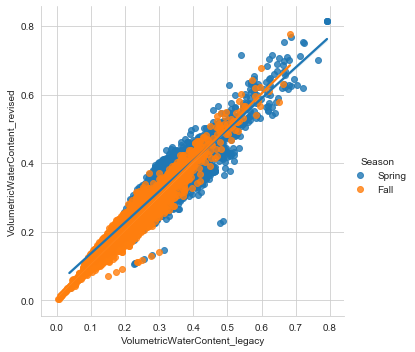

In [7]:
sns.set_style("whitegrid")
sns.lmplot(
    x="VolumetricWaterContent_legacy", 
    y="VolumetricWaterContent_revised", 
    hue="Season",
    data=vwcCompare)

In [8]:
vwcCompareMap = pd.merge(
    legacyVwc, 
    revisedVwc[["ID2", "Year", "Season", "Latitude", "Longitude", "BottomDepth", "VolumetricWaterContent"]], 
    how="right",
    on=["Year", "Season", "ID2", "BottomDepth"],
    suffixes=("_legacy", "_revised"))
vwcCompareMap.head()

,ID2,Year,Season,BottomDepth,VolumetricWaterContent_legacy,Latitude,Longitude,VolumetricWaterContent_revised
0,3,2000,Spring,1,0.330525,46.778791,-117.086678,0.369889
1,5,2000,Spring,1,0.291084,46.778666,-117.085842,0.351070
2,7,2000,Spring,1,0.317162,46.778632,-117.085006,0.401450
3,9,2000,Spring,1,0.276209,46.778674,-117.084170,0.357010
4,11,2000,Spring,1,0.258518,46.778658,-117.083334,0.325461


In [25]:
import geopandas
gdf = geopandas.GeoDataFrame(
    vwcCompareMap,
    geometry=geopandas.points_from_xy(vwcCompareMap.Longitude, vwcCompareMap.Latitude))
gdf = gdf.assign(
    vwcDiff = gdf["VolumetricWaterContent_legacy"] - gdf["VolumetricWaterContent_revised"])
gdf["coords"] = gdf["geometry"].apply(lambda x: x.representative_point().coords[:])
gdf["coords"] = [coords[0] for coords in gdf["coords"]]
gdf.describe()


,ID2,Year,BottomDepth,VolumetricWaterContent_legacy,Latitude,Longitude,VolumetricWaterContent_revised,vwcDiff
count,14608.000000,14608.000000,14608.000000,14608.000000,14608.000000,14608.000000,14608.000000,14608.000000
mean,190.145674,2002.500000,2.996714,0.263745,46.780786,-117.082235,0.275356,-0.011611
std,112.922642,2.291366,1.413871,0.101570,0.001300,0.002902,0.103487,0.025148
min,3.000000,1999.000000,1.000000,0.004369,46.778632,-117.088466,0.004190,-0.173099
25%,93.000000,2000.750000,2.000000,0.177268,46.779684,-117.084371,0.185568,-0.024213
50%,187.000000,2002.500000,3.000000,0.266346,46.780723,-117.082243,0.281360,-0.010564
75%,277.000000,2004.250000,4.000000,0.333076,46.781782,-117.080012,0.350069,0.001190
max,425.000000,2006.000000,5.000000,0.791843,46.783553,-117.076668,0.815646,0.257830


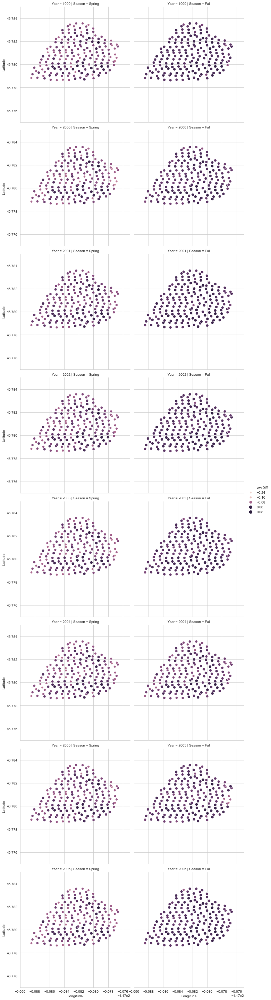

In [39]:
g = sns.relplot(
    data = gdf[gdf["BottomDepth"] == 1.0],
    x="Longitude",
    y="Latitude",
    col="Season",
    row="Year",
    kind="scatter",
    size="vwcDiff", 
    hue="vwcDiff")
g.set(ylim=(46.775, 46.785))
g.set(xlim=(-117.090, -117.075))


In [37]:
#gdfSpring2000 = gdf[(gdf["Season"] == "Spring") & (gdf["Year"] == 2000)]
#gdfSpring2000.plot(markersize=(gdfSpring2000["vwcDiff"] * 10), color = "green")
#
#for idx, row in gdfSpring2000.iterrows():
#    plt.annotate(s=row["ID2"], xy=row["coords"],
#    horizontalalignment="center")

In [42]:
#gdf[gdf["Season"] == "Fall"].plot(markersize=(gdf["vwcDiff"] * 10), color = "orange")

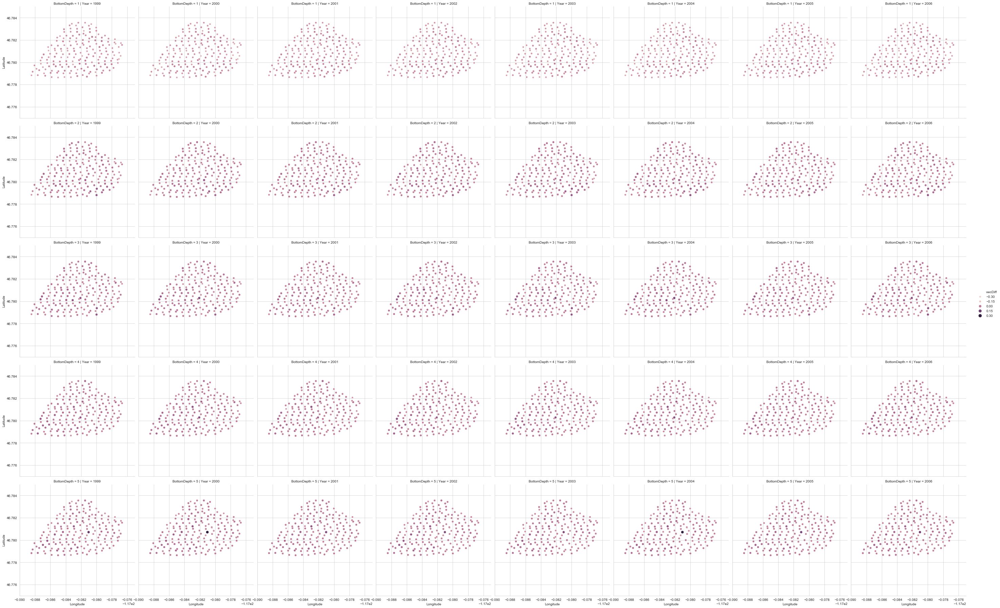

In [40]:
g = sns.relplot(
    data = gdf[gdf["Season"] == "Spring"],
    x="Longitude",
    y="Latitude",
    col="Year",
    row="BottomDepth",
    kind="scatter",
    size="vwcDiff", 
    hue="vwcDiff")
g.set(ylim=(46.775, 46.785))
g.set(xlim=(-117.090, -117.075))

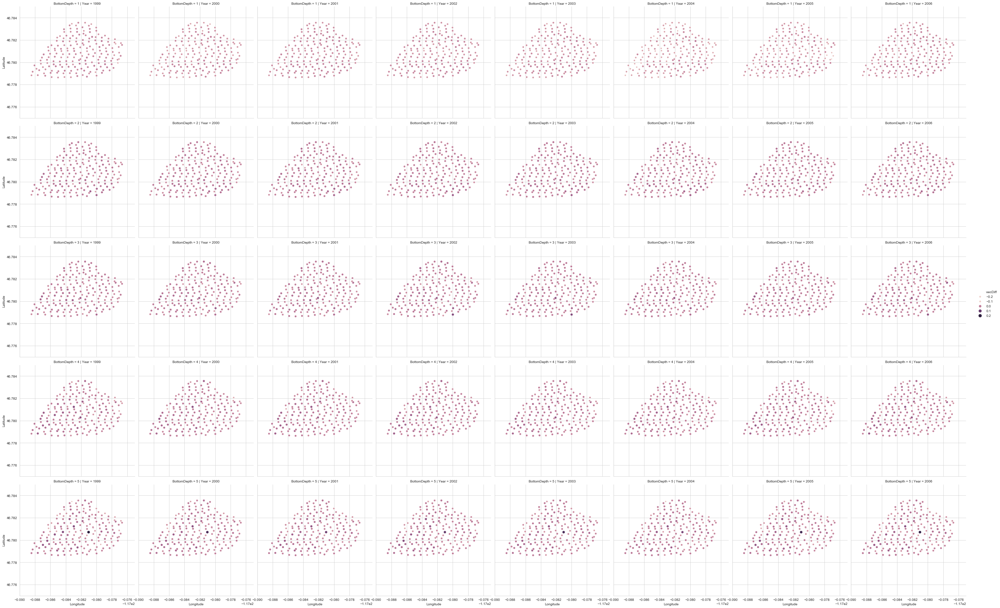

In [41]:
g = sns.relplot(
    data = gdf[gdf["Season"] == "Fall"],
    x="Longitude",
    y="Latitude",
    col="Year",
    row="BottomDepth",
    kind="scatter",
    size="vwcDiff", 
    hue="vwcDiff")
g.set(ylim=(46.775, 46.785))
g.set(xlim=(-117.090, -117.075))